# ESA PolInSAR & BIOMASS 2023
# 7th Advanced Training Course on Radar Polarimetry
# 12-16 June 2023 - ISAE-SUPAERO, Toulouse, France
# Part 1: Multilook and RGB representations for PolSAR data

* Acquisition: San Francisco (USA), ALOS PALSAR, L-band

* Path to images: /projects/data/polsar/ALOS-P1_1__A-ORBIT__ALPSRP202350750/

* SLC (single-look complex) real & imag parts files:
    * HH: i_HH.bin, q_HH.bin
    * HV: i_HV.bin, q_HV.bin
    * VH: i_VH.bin, q_VH.bin
    * VV: i_VV.bin, q_VV.bin
    
* Original Image size (px in azimuth x range): 18432 x 1248


Tips:
- Focus on a azimuth block within pixels [7000, 12000].

In [1]:
%matplotlib widget
# import useful libraries, functions, and modules

import matplotlib.pyplot as plt
import numpy as np
from scipy.ndimage import uniform_filter


**Step 1 : Load data**

In [2]:
# path to data
path = '/home/data/'

img_shape = (18432, 1248)

def read_slc(pol_name):
    slc = np.fromfile(path + 'i_%s.bin' % pol_name, dtype=np.float32) + 1j*np.fromfile(path + 'q_%s.bin' % pol_name, dtype=np.float32)
    return slc.reshape(img_shape) / 1e6

# Read images
slchh = read_slc('HH')
slchv = read_slc('HV')
slcvh = read_slc('VH')
slcvv = read_slc('VV')

# Print image size
slchh.shape

(18432, 1248)

In [3]:
# Crop images in azimuth
crop_az = (7000, 12000)
slchh = slchh[crop_az[0]:crop_az[1], :]
slchv = slchv[crop_az[0]:crop_az[1], :]
slcvh = slcvh[crop_az[0]:crop_az[1], :]
slcvv = slcvv[crop_az[0]:crop_az[1], :]

# Print image size
slchh.shape

(5000, 1248)

# Exercise 1: Speckle noise filtering and data PDFs

Visualize the HH amplitude image before & after multilook and compare intensity PDF distributions

- Amplitude corresponds to the magnitude of the complex SLC (np.abs(slc)): 

- Intensity corresponds to the squarred amplitude (np.abs(slc)**2): 

Tips:
- The multi-look has to be be performed by averaging intensities (abs^2) on a N x N pixels moving window in range - azimuth
- To visualize radar data limit the dynamic range from 0 to 2.5-3 times the mean of the amplitude


In [4]:
looksa = 9
looksr = 5

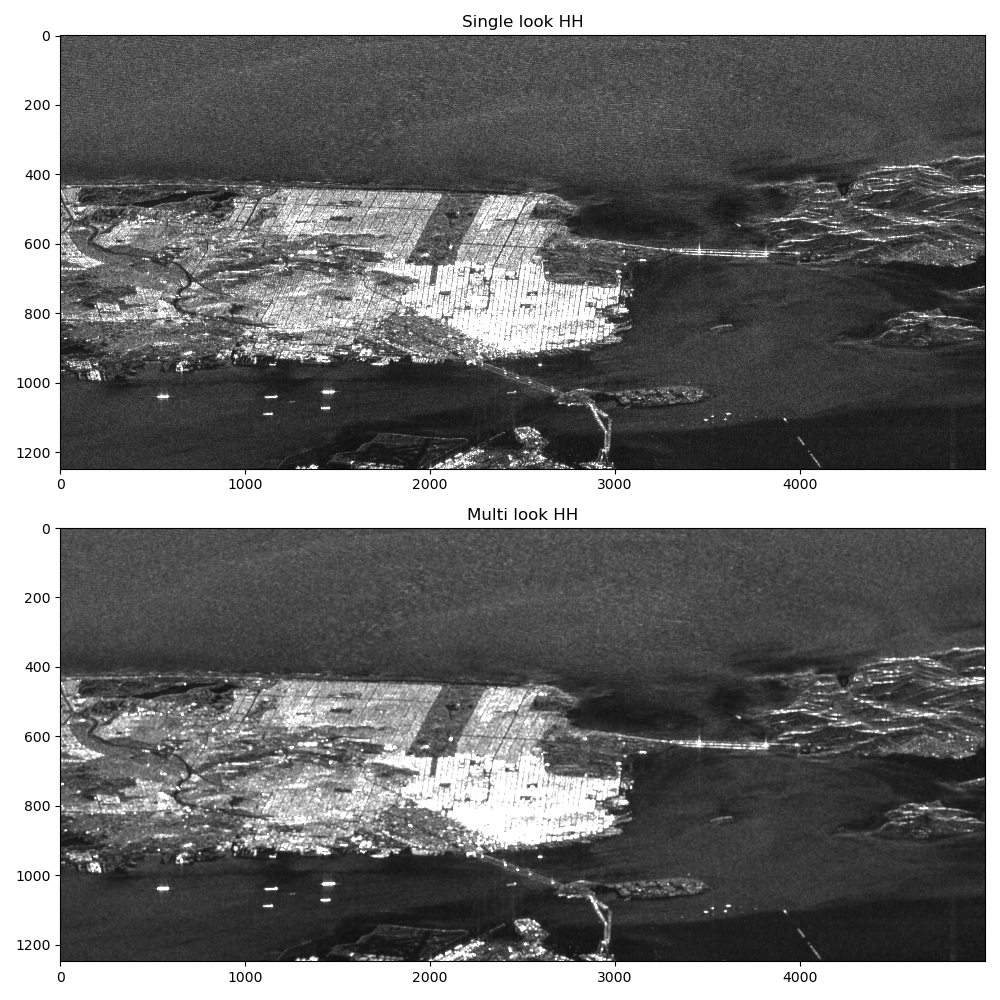

In [5]:
# Multi looking in HH
int_hh = np.abs(slchh)**2
amp_hh_ml = np.sqrt(uniform_filter(int_hh, [looksa, looksr]))
del int_hh

# plot
plt.figure(figsize = (10,10))

ax = plt.subplot(2,1,1)
plt.imshow(np.transpose(np.abs(slchh)), vmin = 0, vmax = 3*np.mean(np.abs(slchh)), cmap = 'gray', aspect = 'auto')
ax.set_title('Single look HH')
plt.tight_layout()

ax = plt.subplot(2,1,2)
plt.imshow(np.transpose(amp_hh_ml), vmin = 0, vmax = 3*np.mean(amp_hh_ml), cmap = 'gray', aspect = 'auto')
ax.set_title('Multi look HH')
plt.tight_layout()


Plot the PDF (histogram) of the intensity at HH before and after the Multilook

Tips:
- Focus on an homogeneous area of the image, like the first 200 samples in range, corresponding to the Sea
- Use numpy ravel() function before calling hist() to flatten the images to 1 dimension

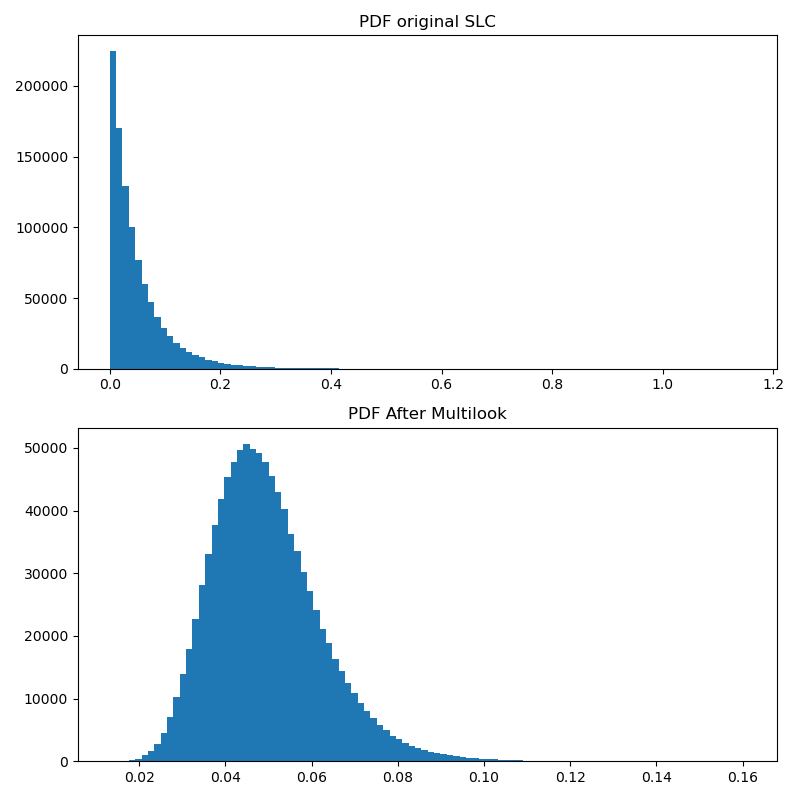

In [6]:
# plot
plt.figure(figsize = (8,8))

ax = plt.subplot(2,1,1)
ax.hist((np.abs(slchh[:,:200])**2).ravel(), 100)
ax.set_title("PDF original SLC")

ax = plt.subplot(2,1,2)
ax.hist((amp_hh_ml[:,:200]**2).ravel(), 100)
ax.set_title("PDF After Multilook")
plt.tight_layout()


# Exercise 2: Visualization of the polarimetric information

Create, visualize and compare (where are the same? where are different?) RGB composite images using 

- Lexicographic basis: 
    * R = HH
    * G = HV
    * B = VV 
- Pauli basis: 
    * R = HH-VV
    * G = 2 * HV (or HV + VH)
    * B = HH+VV

Tips:
- include multi-look - to be be performed by averaging intensities (abs^2) on a N x N pixels moving window in range - azimuth
- To visualize radar data limit the dynamic range from 0 to 2.5-3 times the mean of the amplitude at each channel

In [7]:
#### Lexicographic and Pauli representations

# Lexicographic
amphh = np.sqrt(uniform_filter(np.abs(slchh)**2, [looksa, looksr]))
ampvv = np.sqrt(uniform_filter(np.abs(slcvv)**2, [looksa, looksr]))
amphv = np.sqrt(uniform_filter(np.abs(slchv)**2, [looksa, looksr]))
                
# Initialize RGB array (Npx_rg, Npx_az, 3)
dimaz = amphh.shape[0]
dimrg = amphh.shape[1] 
rgb_lex = np.zeros((dimrg, dimaz, 3), 'float32')

rgb_lex[:,:,0] = np.clip(np.transpose(amphh), 0, 2.5*np.mean(amphh))
rgb_lex[:,:,1] = np.clip(np.transpose(amphv), 0, 2.5*np.mean(amphv))
rgb_lex[:,:,2] = np.clip(np.transpose(ampvv), 0, 2.5*np.mean(ampvv))

rgb_lex[:,:,0] = rgb_lex[:,:,0] / np.max(rgb_lex[:,:,0])
rgb_lex[:,:,1] = rgb_lex[:,:,1] / np.max(rgb_lex[:,:,1])
rgb_lex[:,:,2] = rgb_lex[:,:,2] / np.max(rgb_lex[:,:,2])


# delete variables
del amphh, amphv, ampvv

In [8]:
# Pauli amplitudes
pauli1 = np.abs(slchh+slcvv)**2
pauli1 = np.sqrt(uniform_filter(pauli1, [looksa, looksr]))
pauli2 = np.abs(slchh-slcvv)**2
pauli2 = np.sqrt(uniform_filter(pauli2, [looksa, looksr]))
pauli3 = np.abs(2*slchv)**2
pauli3 = np.sqrt(uniform_filter(pauli3, [looksa, looksr]))

# initialize array
rgb_pauli = np.zeros((dimrg, dimaz, 3), 'float32')

rgb_pauli[:,:,0] = np.clip(np.transpose(pauli2), 0, 2.5*np.mean(pauli2))
rgb_pauli[:,:,1] = np.clip(np.transpose(pauli3), 0, 2.5*np.mean(pauli3))
rgb_pauli[:,:,2] = np.clip(np.transpose(pauli1), 0, 2.5*np.mean(pauli1))

rgb_pauli[:,:,0] = rgb_pauli[:,:,0] / np.max(rgb_pauli[:,:,0])
rgb_pauli[:,:,1] = rgb_pauli[:,:,1] / np.max(rgb_pauli[:,:,1])
rgb_pauli[:,:,2] = rgb_pauli[:,:,2] / np.max(rgb_pauli[:,:,2])


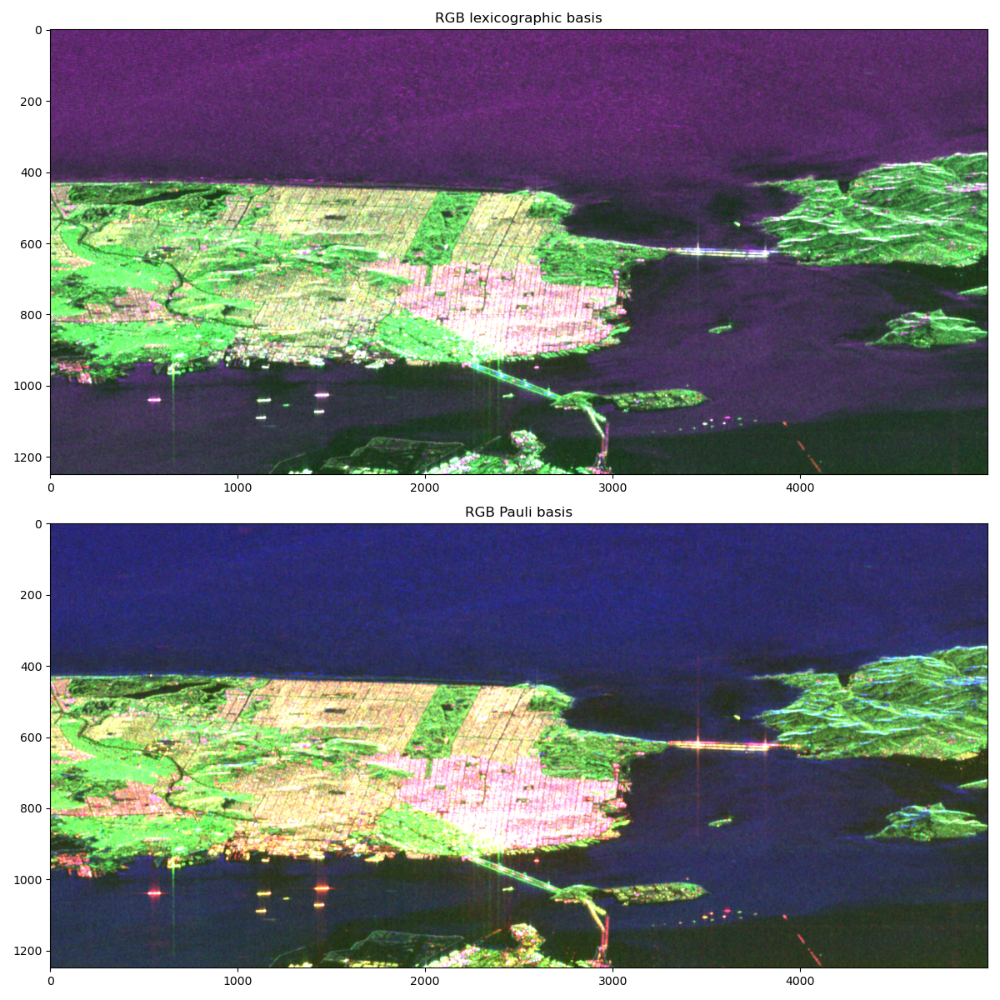

In [9]:
# plots

plt.figure(figsize = (12,12))

## lexicographic
ax = plt.subplot(2,1,1)
plt.imshow(rgb_lex, aspect = 'auto')
ax.set_title('RGB lexicographic basis')
plt.tight_layout()

## Pauli
ax = plt.subplot(2,1,2)
plt.imshow(rgb_pauli, aspect = 'auto')
ax.set_title('RGB Pauli basis')
plt.tight_layout()



## Exercise 3: Characterization of scattering mechanisms

Computation of the alpha1 angle.

In [10]:
del slchh, slcvv, slchv

In [11]:
# Compute the alpha angle

# --- calculate the length of the Pauli vector
pauli_l = np.sqrt(np.abs(pauli1)**2 + np.abs(pauli2)**2 + np.abs(pauli3)**2)

# --- compute alpha angle [rad]
alpha = np.arccos(np.abs(pauli1) / pauli_l)

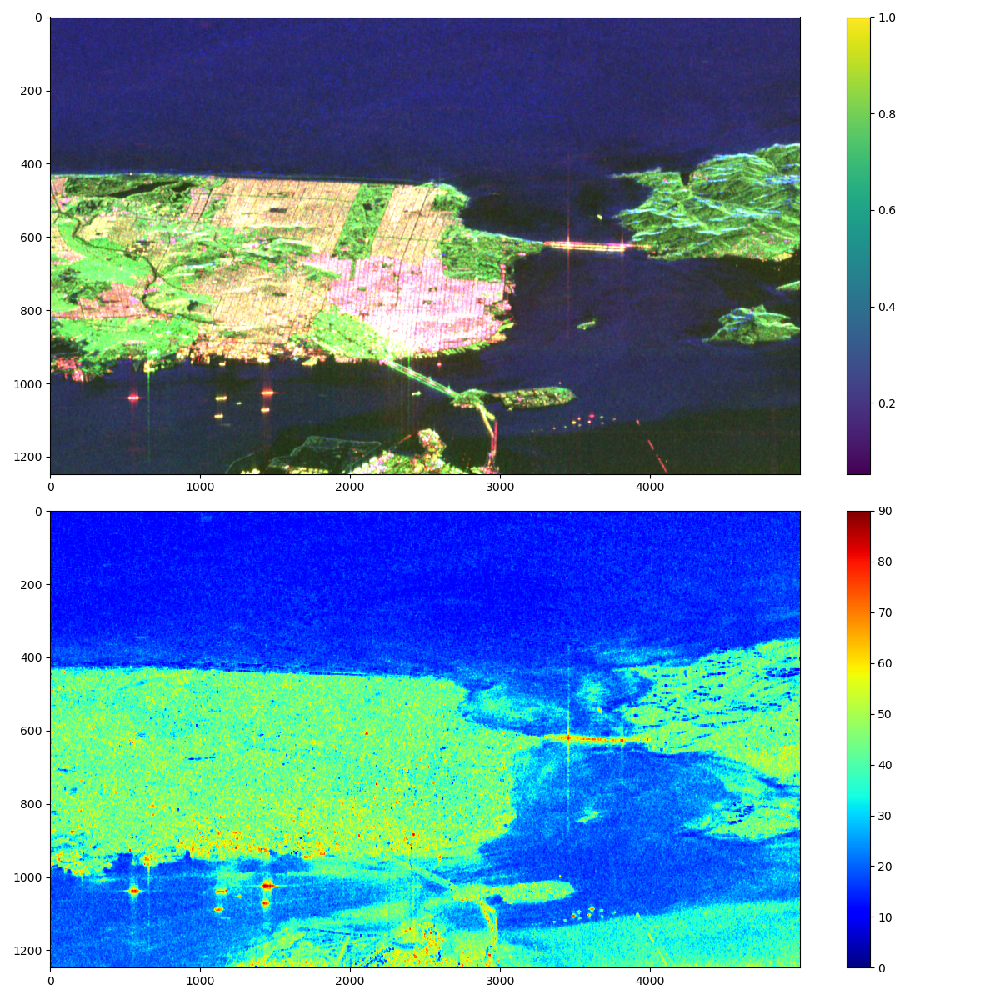

In [12]:
# plots

plt.figure(figsize=(12,12))
plt.subplot(2,1,1)
plt.imshow(rgb_pauli, aspect='auto')
plt.colorbar() # dummy colorbar to align images
plt.subplot(2,1,2)
plt.imshow(np.transpose(alpha) * 180/np.pi , cmap = 'jet', vmin = 0, vmax = 90, aspect = 'auto', interpolation = 'nearest')
plt.colorbar()
plt.tight_layout()